<a href="https://colab.research.google.com/github/grkw/mushroom-classifier/blob/main/mushroom-classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
maysee_mushrooms_classification_common_genuss_images_path = kagglehub.dataset_download('maysee/mushrooms-classification-common-genuss-images')

print('Data source import complete.')


classes:  ['Entoloma', 'Suillus', 'Hygrocybe', 'Agaricus', 'Amanita', 'Lactarius', 'Russula', 'Boletus', 'Cortinarius']


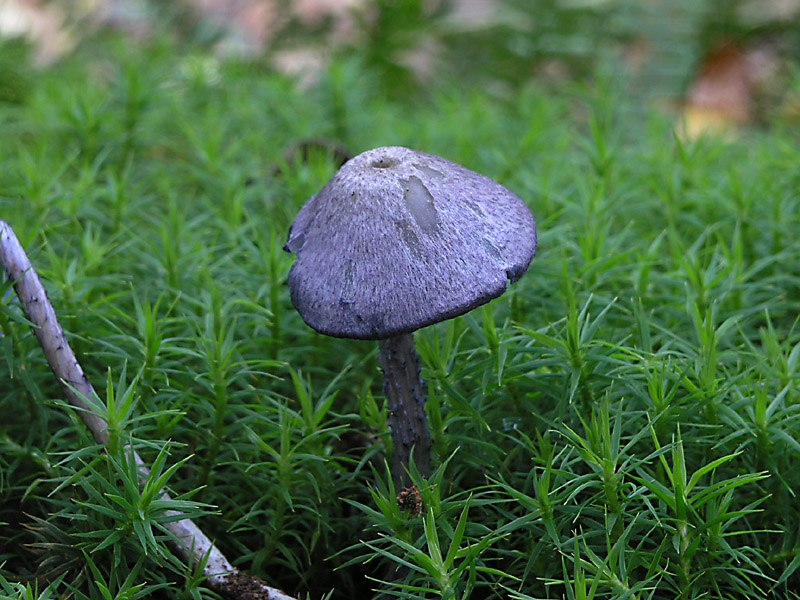

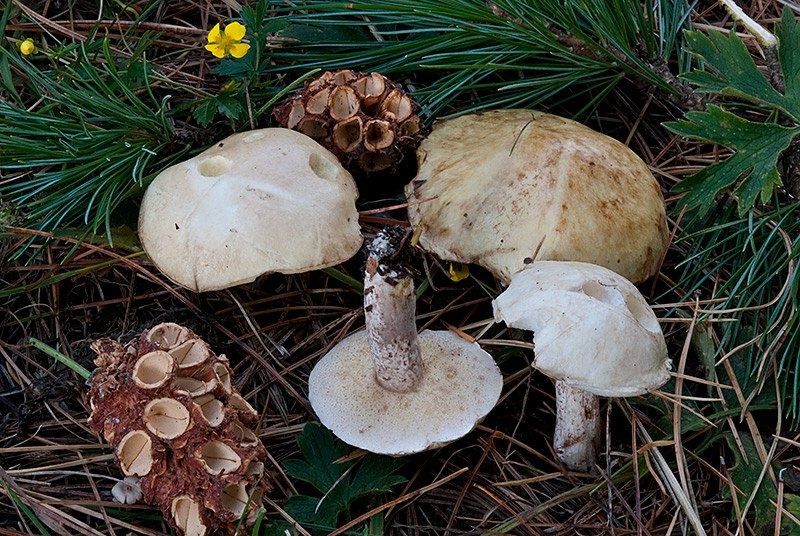

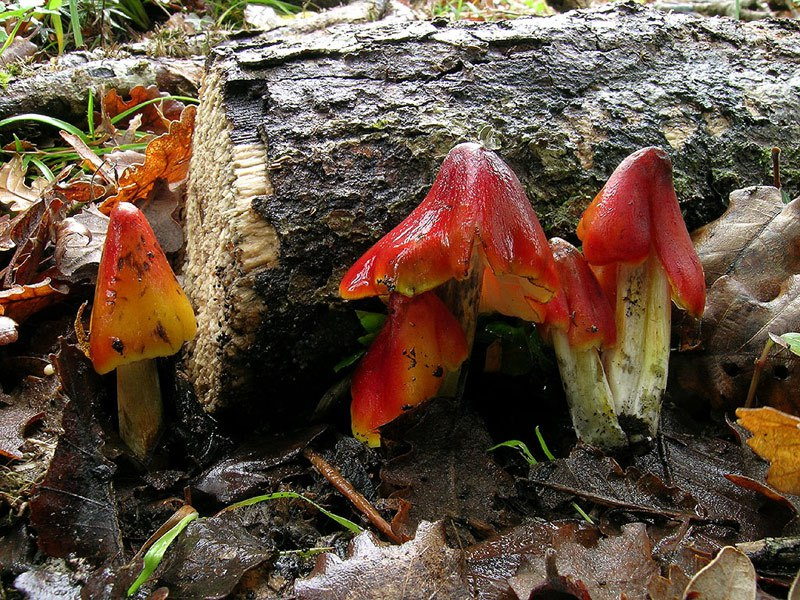

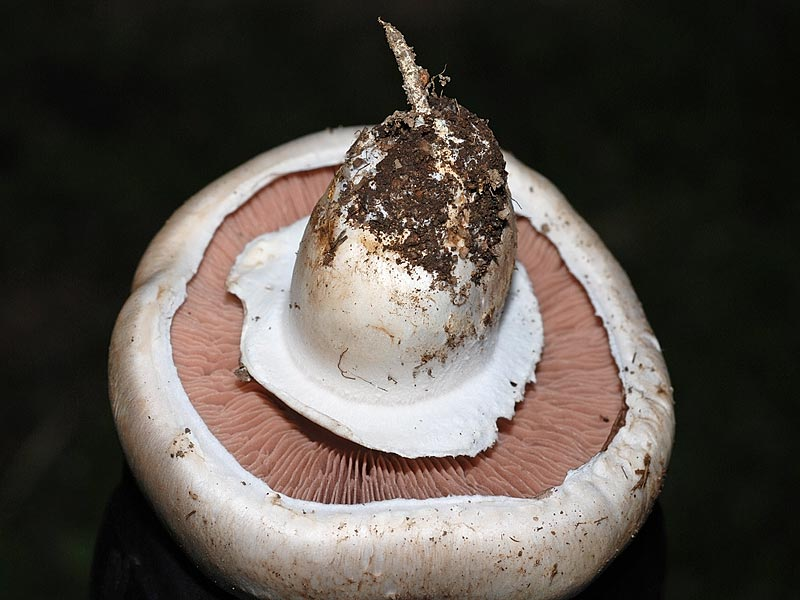

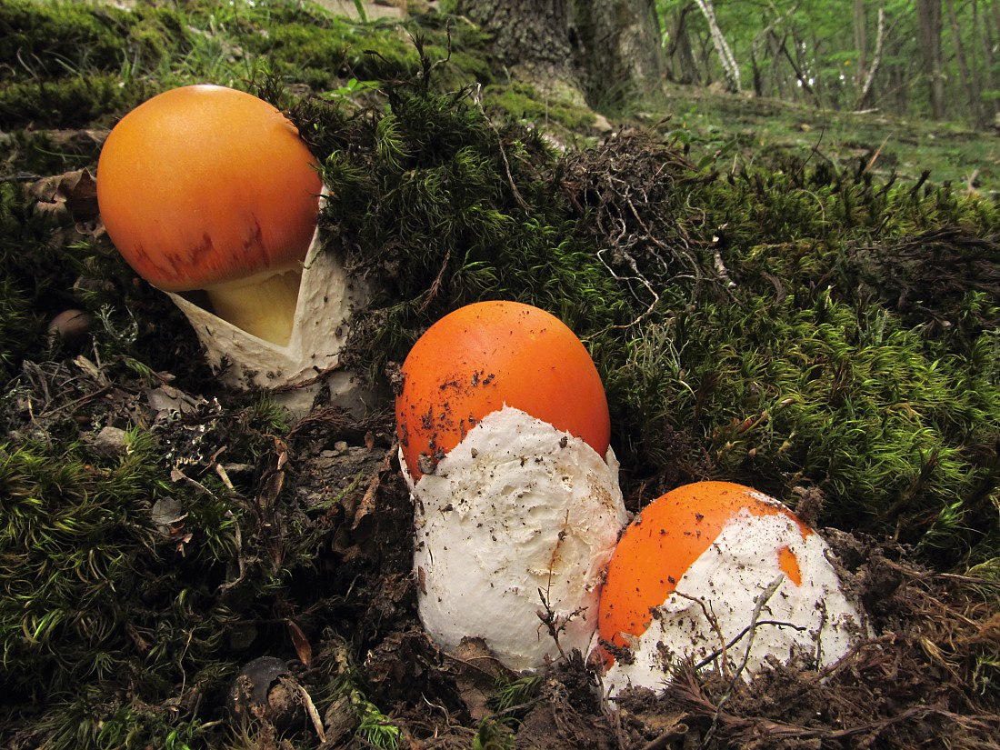

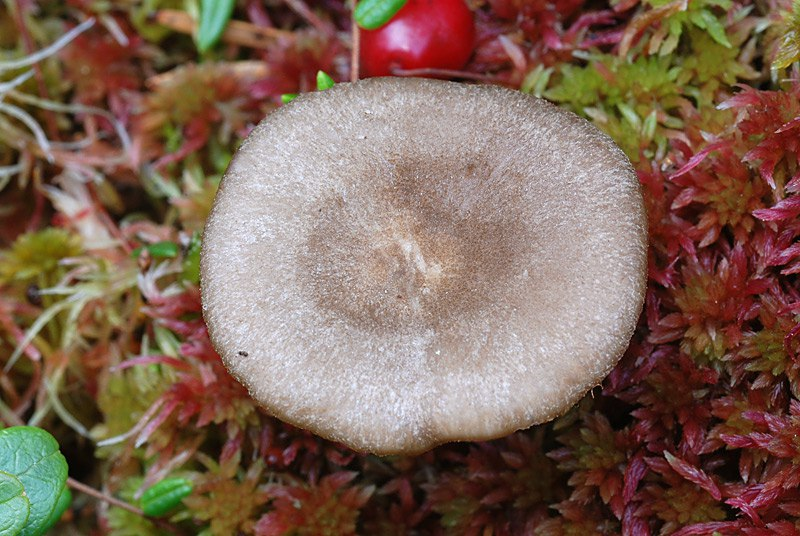

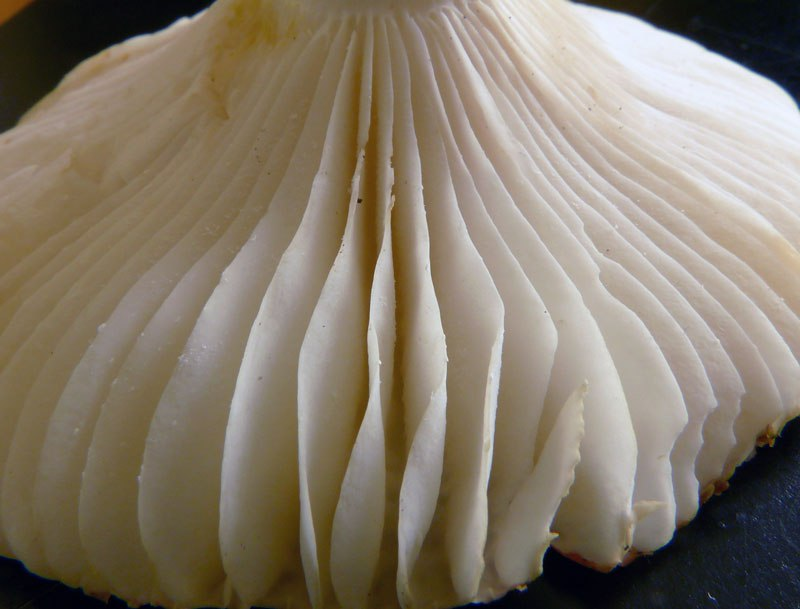

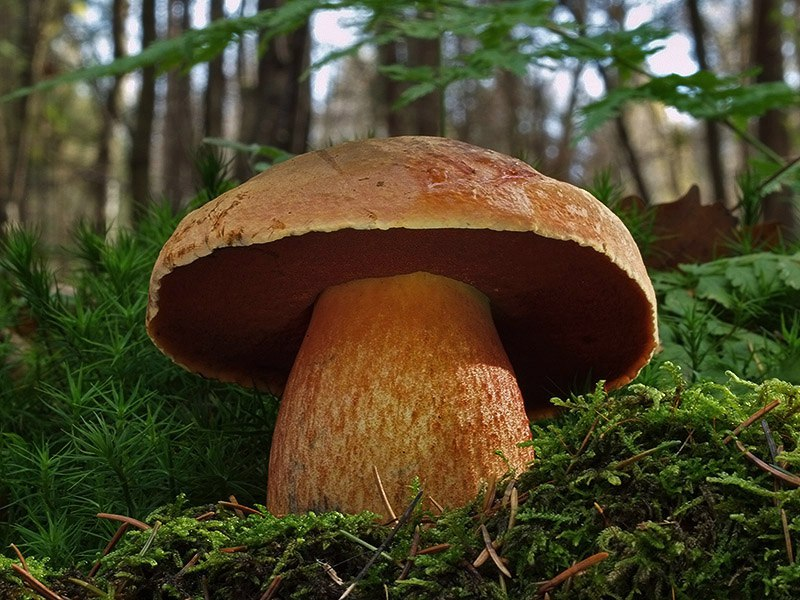

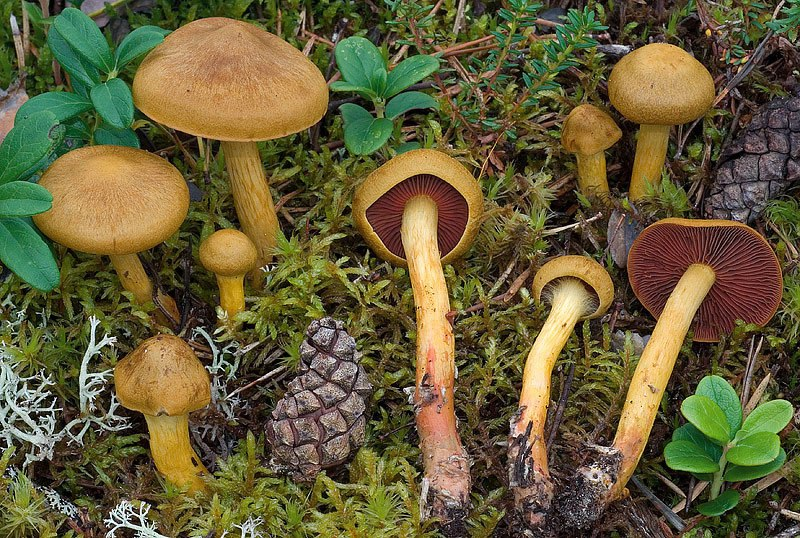

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os

dir_path = '/kaggle/input/mushrooms-classification-common-genuss-images/Mushrooms'
classes = os.listdir(dir_path)
print("classes: ", classes)

imgs = []
for c in classes:
    class_path = dir_path + '/' + c
    first_img_path = os.listdir(class_path)[0]
    img = Image.open(class_path + '/' + first_img_path)
    imgs.append(img)

display(*imgs)

In [ ]:
import matplotlib.pyplot as plt

heights = []
widths = []

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        im = Image.open(path)
        width, height = im.size
        widths.append(width)
        heights.append(height)

plt.hist(heights)
plt.xlabel('height')
plt.ylabel('image count')
plt.show()

plt.hist(widths)
plt.xlabel('width')
plt.ylabel('image count')
plt.show()
# get the total size and the size of each class
# get the distribution of image sizes

KeyboardInterrupt: 

# Data pre-processing

In [ ]:
import os
import pandas as pd
from torchvision.io import decode_image

class MushroomImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        image = decode_image(img_path)
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

In [ ]:
# Get dataset of all cropped images to 500x500x300
import torchvision.transforms as transforms
import shutil

transform_img = transforms.Compose([
 transforms.CenterCrop(500),
 transforms.ToTensor(),
])

# Where all the images will live
img_dir = 'kaggle/working/mushrooms'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)

df = pd.DataFrame(columns=['filename', 'class'])

# Get the each image, if it's small enough, add it to the new folder and add it to the annotation list
for idx, c in enumerate(classes):
    print(c)
    class_path = os.path.join(dir_path, c)
    img_paths = os.listdir(class_path)
    for img_path in img_paths:
        img = Image.open(class_path + '/' + img_path)
        height, width = img.size
        if height >= 500 and width >= 500:
            # print("copying")
            new_path = os.path.join(img_dir, img_path)
            shutil.copy(os.path.join(dir_path, c, img_path), new_path) # Move to the dataset folder
            df.loc[-1] = [new_path, idx]
    break

# Create csv of image filename, classification
df.to_csv("kaggle/working/annotations_file.csv")

Entoloma


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

In [ ]:
# Input: 500x800x3
class CNNStateSelector(nn.Module):
    def __init__(self):
        super(CNNStateSelector, self).__init__()
        self.conv1 = nn.Conv1d(1, 20, 5)
        self.conv2 = nn.Conv1d(20, 50, 5)
        self.fc1 = nn.Linear(50, 10)
        self.fc2 = nn.Linear(10, (18*2+1)*(19*2+1))
        # self.fc2 = nn.Linear(10, 1) #output is a continuous value but since the outputs are discrete, we need to use a softmax layer
        # should train like a classification problem since I have that for the outputs and anything more granular wouldn't make a signficant difference in execution time, and to handle -1,0 case

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool1d(x, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool1d(x, 2)
        x = x.view(-1, 50)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        x = self.Softmax(x)
        return x